## LLAVA 모델 테스트

- llava code : https://github.com/haotian-liu/LLaVA
- llava model hub : https://huggingface.co/liuhaotian/llava-v1.5-13b
- CLI 코드 참고: https://github.com/haotian-liu/LLaVA/blob/main/llava/serve/cli.py

In [1]:
!pip list | grep transformers

transformers                  4.34.1


In [2]:
from huggingface_hub import snapshot_download
from pathlib import Path
import os

local_model_path = Path("./pretrained-models")
local_model_path.mkdir(exist_ok=True)
model_name = "liuhaotian/llava-v1.5-13b"
allow_patterns = ["*.json", "*.pt", "*.bin", "*.txt", "*.model"]

model_download_path = snapshot_download(
    repo_id=model_name,
    cache_dir=local_model_path,
    allow_patterns=allow_patterns,
)

Fetching 10 files:   0%|          | 0/10 [00:00<?, ?it/s]

In [3]:
print(model_download_path)

pretrained-models/models--liuhaotian--llava-v1.5-13b/snapshots/d64eb781be6876a5facc160ab1899281f59ef684


In [24]:
# 가장 최신버전
# !pip install -q git+https://github.com/haotian-liu/LLaVA.git

# 특정 버전 설치
# v1.1.1 : https://github.com/haotian-liu/LLaVA/releases/tag/v1.1.1
# !pip install -q git+https://github.com/haotian-liu/LLaVA.git@v1.1.1

In [8]:
!pip list | grep llava

llava                         1.1.1


In [9]:
import torch

from llava.constants import IMAGE_TOKEN_INDEX, DEFAULT_IMAGE_TOKEN, DEFAULT_IM_START_TOKEN, DEFAULT_IM_END_TOKEN
from llava.conversation import conv_templates, SeparatorStyle
from llava.model.builder import load_pretrained_model
from llava.utils import disable_torch_init
from llava.mm_utils import process_images, tokenizer_image_token, get_model_name_from_path, KeywordsStoppingCriteria

from PIL import Image

import requests
from PIL import Image
from io import BytesIO
from transformers import TextStreamer

[2023-10-27 08:18:39,185] [INFO] [real_accelerator.py:110:get_accelerator] Setting ds_accelerator to cuda (auto detect)


In [10]:
model_path = model_download_path
disable_torch_init()
tokenizer, model, image_processor, context_len = load_pretrained_model(
    model_path, model_base=None, model_name="llava", load_8bit=True)

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [11]:
conv_mode = "llava_v1"

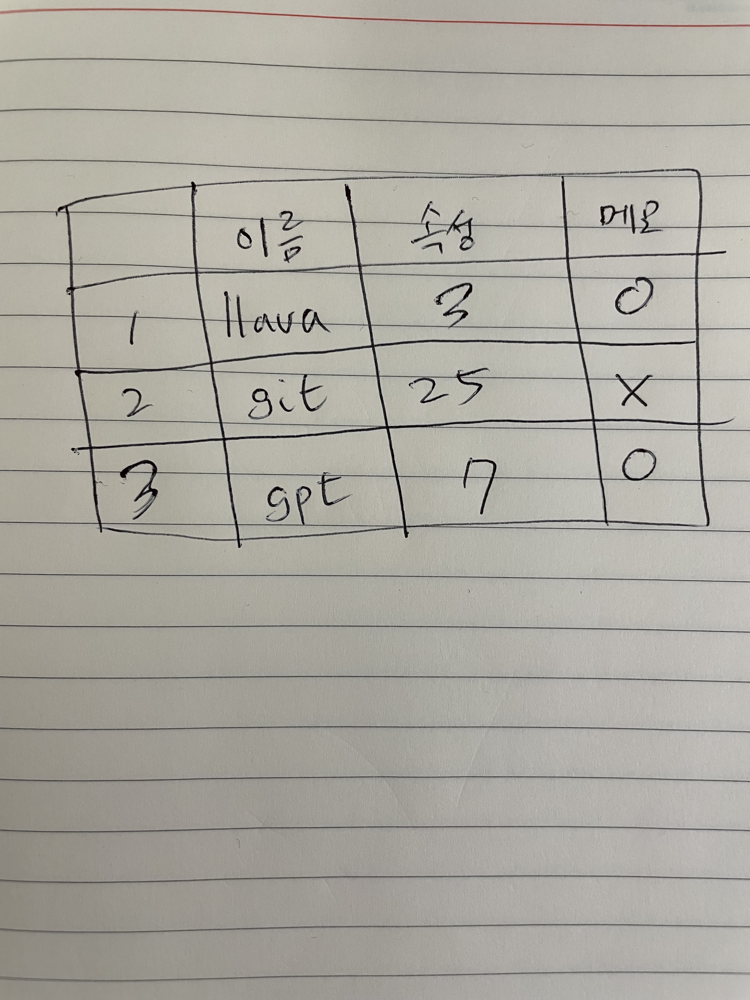

In [12]:
image_path = "sample_images/test_01.jpg"
raw_image = Image.open(image_path).convert('RGB')
raw_image

In [13]:
class ModelConfig:
    def __init__(self):
        image_aspect_ratio = "pad"

model_cfg = ModelConfig()

image_tensor = process_images([raw_image], image_processor, model_cfg)
if type(image_tensor) is list:
    image_tensor = [image.to(model.device, dtype=torch.float16) for image in image_tensor]
else:
    image_tensor = image_tensor.to(model.device, dtype=torch.float16)

In [14]:
inp = "What is the value in the last row of table?"

In [15]:
conv = conv_templates[conv_mode].copy()
roles = conv.roles

In [17]:
if raw_image is not None:
    # first message
    if model.config.mm_use_im_start_end:
        inp = DEFAULT_IM_START_TOKEN + DEFAULT_IMAGE_TOKEN + DEFAULT_IM_END_TOKEN + '\n' + inp
    else:
        inp = DEFAULT_IMAGE_TOKEN + '\n' + inp
    conv.append_message(conv.roles[0], inp)
    image = None
else:
    # later messages
    conv.append_message(conv.roles[0], inp)

conv.append_message(conv.roles[1], None)
prompt = conv.get_prompt()

In [18]:
print(prompt)

A chat between a curious human and an artificial intelligence assistant. The assistant gives helpful, detailed, and polite answers to the human's questions. USER: <image>
What is the value in the last row of table? ASSISTANT:


In [19]:
temperature = 0.2
max_new_tokens = 512

In [20]:
input_ids = tokenizer_image_token(
    prompt, tokenizer, IMAGE_TOKEN_INDEX, return_tensors='pt').unsqueeze(0).cuda()
stop_str = conv.sep if conv.sep_style != SeparatorStyle.TWO else conv.sep2
keywords = [stop_str]
stopping_criteria = KeywordsStoppingCriteria(keywords, tokenizer, input_ids)
streamer = TextStreamer(tokenizer, skip_prompt=True, skip_special_tokens=True)

with torch.inference_mode():
    output_ids = model.generate(
        input_ids,
        images=image_tensor,
        do_sample=True,
        temperature=temperature,
        max_new_tokens=max_new_tokens,
        # streamer=streamer,
        streamer=None,
        use_cache=True,
        stopping_criteria=[stopping_criteria])

outputs = tokenizer.decode(output_ids[0, input_ids.shape[1]:]).strip()
conv.messages[-1][-1] = outputs


In [21]:
print(outputs)

The value in the last row of the table is zero.</s>


### 결과 분석

- 어려운 task에 대해서 결과가 틀리긴 했지만 흥미로움.
- 모델 배포 위해서 모델을 S3에 업로드 해 놓도록 함.

In [5]:
import sagemaker
sagemaker_session = sagemaker.Session()

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/ec2-user/.config/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/ec2-user/.config/sagemaker/config.yaml


In [6]:
print(f"Model downloaded: {model_download_path}")
s3_model_prefix = "llm/llava/llava-v15/model"  # folder where model checkpoint will go
model_artifact = sagemaker_session.upload_data(path=model_download_path, key_prefix=s3_model_prefix)
print(f"s3 Model uploaded: {model_artifact}")

Model downloaded: pretrained-models/models--liuhaotian--llava-v1.5-13b/snapshots/d64eb781be6876a5facc160ab1899281f59ef684
s3 Model uploaded: s3://sagemaker-us-west-2-723597067299/llm/llava/llava-v15/model


In [7]:
%store model_artifact
%store model_download_path

Stored 'model_artifact' (str)
Stored 'model_download_path' (str)
